In [63]:
import gpytorch
import torch

from tqdm.autonotebook import tqdm
import numpy as np
import itertools
import logging
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [64]:
%config InlineBackend.figure_format = "retina"
sns.set()

In [65]:
df = pd.read_csv("data.csv")
df

,Time post-injection (months),MBSC Region,iM2,iM1,iAI,iPrL,iMO,iVO,iDP,cM2,...,iSuC,iIC,iPnO,cV-b,cEnt,cPS,cRSA,cSuC,cIC,cPnO
0,1,NTG,0.014842,0.000000,0.003629,0.006650,0.000000,0.011567,0.000189,0.001134,...,0.000000,0.002816,0.000000,0.000000,0.000078,0.000164,0.000000,0.000000,0.000000,0.000108
1,1,NTG,0.227463,0.016372,0.139844,0.044689,0.002673,0.015362,0.016991,0.026859,...,0.000000,0.002742,0.000483,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000071
2,1,NTG,0.266335,0.008691,0.028367,0.092924,0.009293,0.009727,0.010178,0.021157,...,0.000000,0.002642,0.000739,0.000193,0.002247,0.000000,0.000000,0.000206,0.000038,0.000079
3,1,NTG,0.042362,0.005238,0.044917,0.021161,0.002880,0.001877,0.010599,0.021431,...,0.000000,0.000833,0.000566,0.000540,0.000000,0.001798,0.000000,0.000000,0.000000,0.000000
4,1,G20,0.023577,0.004621,0.003638,0.000000,0.001450,0.000000,0.000941,0.005575,...,0.000000,0.000332,0.000000,0.000000,0.000102,0.000000,0.000000,0.000000,0.000309,0.000047
5,1,G20,0.324371,0.036880,0.071656,0.011516,0.001394,0.005631,0.002850,0.096962,...,0.000000,0.000495,0.000000,0.000381,0.000000,0.003167,0.000000,0.000000,0.000000,0.000216
6,1,G20,0.016340,0.000567,0.004682,0.000214,0.000276,0.003756,0.000000,0.010201,...,0.000080,0.004816,0.000000,0.006639,0.000379,0.001826,0.000000,0.002939,0.000711,0.003205
7,1,G20,0.135917,0.013436,0.040500,0.043342,0.000000,0.003332,0.017234,0.041776,...,0.000059,0.000417,0.000890,0.000000,0.000000,0.000291,0.000000,0.000000,0.000097,0.000000
8,1,G20,0.058894,0.002256,0.010915,0.024721,0.013671,0.023185,0.002531,0.015196,...,0.000054,0.001459,0.000277,0.000117,0.000000,0.000000,0.000692,0.000000,0.000000,0.000075
9,1,G20,0.103370,0.034662,0.061016,0.004168,0.001304,0.000341,0.006339,0.151783,...,0.000000,0.000812,0.000060,0.000179,0.000000,0.000239,0.000000,0.000000,0.000064,0.000000


In [66]:
for c in df.columns:
    if len(df[c].unique()) == 1:
        df.drop(c, axis=1, inplace=True)
        print(f"I droped {c}")

In [67]:
df.dropna(axis=0, inplace=True)

In [70]:
x_name = "Time post-injection (months)"
cond_name = "MBSC Region"

v = df[x_name]
df[x_name] = v - v.mean() / v.std()

In [71]:
x_data = {}

for cond in "G20", "NTG":
    x = df.loc[df[cond_name] == cond, x_name].values
    x = torch.from_numpy(x.astype(np.float32))
    x_data[cond] = x

In [72]:
df.drop("Time post-injection (months)", axis=1, inplace=True)

In [73]:
for c in df.columns:
    if c == "MBSC Region":
        continue
    v = df[c].values
    v = np.log(v + 1e-04)
    df[c] = (v - v.mean()) / v.std()
df

,MBSC Region,iM2,iM1,iAI,iPrL,iMO,iVO,iDP,cM2,cM1,...,iSuC,iIC,iPnO,cV-b,cEnt,cPS,cRSA,cSuC,cIC,cPnO
0,NTG,-2.461115,-3.714456,-1.965595,-0.263506,-2.253445,-0.037364,-2.424987,-3.430867,-1.476057,...,-0.517164,0.973240,-0.942481,-1.083079,-0.752306,-0.103116,-0.290304,-0.526917,-0.632759,-0.189668
1,NTG,1.026199,0.051866,1.833156,1.035155,-0.049502,0.174774,0.212081,-0.207305,1.240692,...,-0.517164,0.954842,0.206320,-1.083079,-1.135076,-0.951269,-0.290304,-0.526917,-0.632759,-0.327475
2,NTG,1.228148,-0.411443,0.164401,1.536706,0.759642,-0.166679,-0.116757,-0.455709,-1.787624,...,-0.517164,0.929466,0.443095,-0.415955,0.955102,-0.951269,-0.290304,0.298027,-0.315147,-0.294946
3,NTG,-1.123654,-0.779577,0.644631,0.523844,-0.001795,-1.374627,-0.090827,-0.442287,-0.778801,...,-0.517164,0.162688,0.292851,0.068407,-1.135076,1.624231,-0.290304,-0.526917,-0.632759,-0.703097
4,G20,-1.871646,-0.870270,-1.963020,-3.153937,-0.435268,-3.623074,-1.597399,-1.836135,-1.144415,...,-0.517164,-0.384271,-0.942481,-1.083079,-0.670527,-0.951269,-0.290304,-0.526917,0.745842,-0.432464
5,G20,1.480509,0.648585,1.133187,0.109056,-0.459895,-0.573015,-0.923917,1.131708,0.820628,...,-0.517164,-0.156758,-0.942481,-0.108001,-1.135076,2.099560,-0.290304,-0.526917,-0.632759,0.104696
6,G20,-2.338771,-2.314067,-1.704901,-2.369626,-1.375434,-0.871509,-3.112217,-1.212910,-0.743556,...,0.034379,1.344531,-0.942481,1.529554,-0.096911,1.637064,-0.290304,1.994685,1.416280,1.750859
7,G20,0.367153,-0.092972,0.536422,1.014190,-2.253445,-0.959344,0.221210,0.253029,-0.600529,...,-0.081929,-0.256903,0.550576,-1.083079,-1.135076,0.242938,-0.290304,-0.526917,0.031786,-0.703097
8,G20,-0.702572,-1.382959,-0.830563,0.630095,1.013425,0.483248,-0.997958,-0.799684,-1.357878,...,-0.113779,0.528085,-0.078336,-0.601829,-1.135076,-0.951269,2.701723,-0.526917,-0.632759,-0.311129
9,G20,0.016918,0.602956,0.965013,-0.578064,-0.500873,-2.504635,-0.419155,1.599741,1.101094,...,-0.517164,0.146966,-0.637889,-0.446507,-1.135076,0.116588,-0.290304,-0.526917,-0.147497,-0.703097


In [74]:
y_data = {}

for cond in "G20", "NTG":
    df_cond = df[df["MBSC Region"] == cond]
    y = df_cond.drop("MBSC Region",axis=1).values.astype(np.float32)
    y = torch.from_numpy(y.flatten()).reshape(*y.shape)
    y_data[cond] = y

In [75]:
class MultitaskGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood, num_tasks):
        super(MultitaskGPModel, self).__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.MultitaskMean(
            gpytorch.means.ConstantMean(), num_tasks
        )
        self.covar_module = gpytorch.kernels.MultitaskKernel(
            gpytorch.kernels.RBFKernel(), num_tasks, rank=1
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultitaskMultivariateNormal(mean_x, covar_x)

In [76]:
def train(train_x, train_y):
    num_tasks = train_y.shape[-1]
    print("num tasks:", num_tasks)

    likelihood = gpytorch.likelihoods.MultitaskGaussianLikelihood(num_tasks=num_tasks)
    model = MultitaskGPModel(train_x, train_y, likelihood, num_tasks=num_tasks)


    # Number of epochs
    epochs = 1000


    # Find optimal model hyperparameters
    model.train()
    likelihood.train()

    # Use the adam optimizer
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)  # Includes GaussianLikelihood parameters

    # "Loss" for GPs - the marginal log likelihood
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    hist_loss = []

    with tqdm(total=epochs) as pbar:

        for i in range(epochs):
            # Zero gradients from previous iteration
            optimizer.zero_grad()
            # Output from model
            output = model(train_x)
            # Calc loss and backprop gradients
            loss = -mll(output, train_y)
            loss.backward()

            hist_loss.append(loss.item())

            # model.covar_module.base_kernel.lengthscale.item(),
            # model.likelihood.noise.item()
            optimizer.step()

            pbar.set_postfix(loss=loss.item())
            pbar.update()

    return model, likelihood

In [77]:
results = {}
for cond in 'G20', 'NTG':
    train_x = x_data[cond]
    train_y = y_data[cond]
    model, likelihood = train(train_x=train_x, train_y=train_y)
    results[cond] = {"model": model, "likelihood": likelihood}

num tasks: 116


  0%|          | 0/1000 [00:00<?, ?it/s]

num tasks: 116


  0%|          | 0/1000 [00:00<?, ?it/s]

In [78]:
column = list(df.columns)
column.remove("MBSC Region")

In [79]:
test_x = torch.linspace(torch.cat(list(x_data.values())).min(), torch.cat(list(x_data.values())).max(), 50)

In [80]:
def predict(test_x, model, likelihood):
    
    # Set into eval mode
    model.eval()
    likelihood.eval()

    # Make predictions
    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        predictions = likelihood(model(test_x))
        mean = predictions.mean
        lower, upper = predictions.confidence_region()
    
    return mean, lower, upper

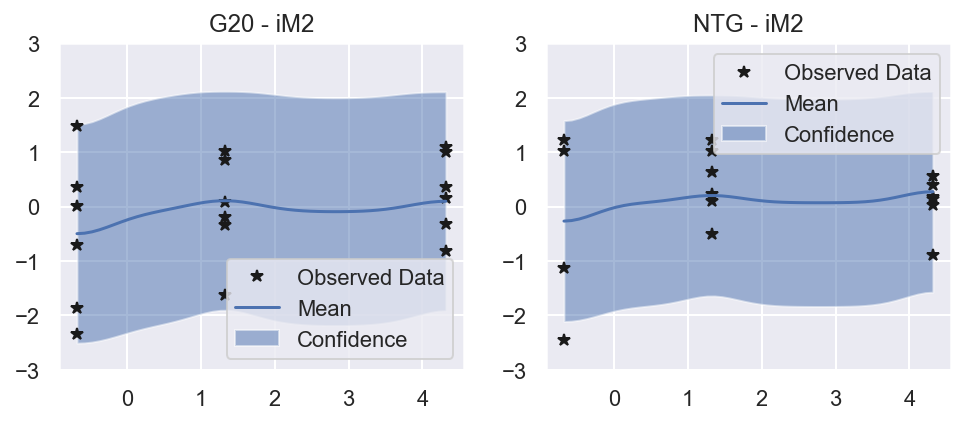

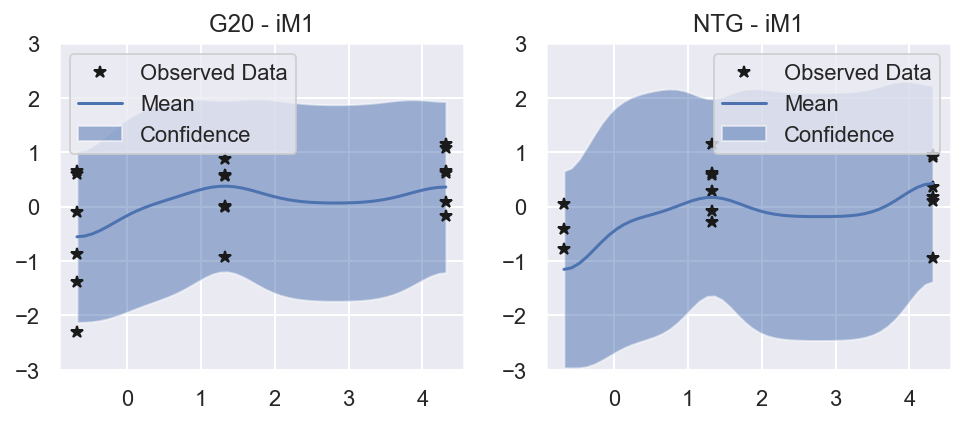

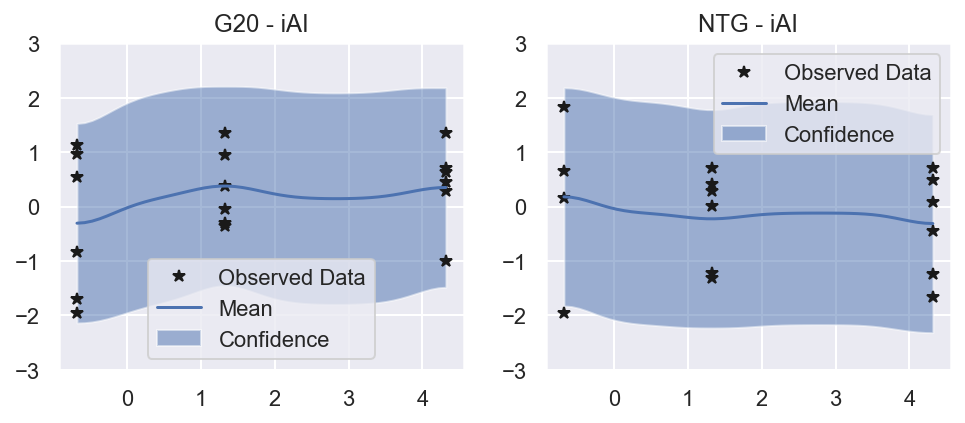

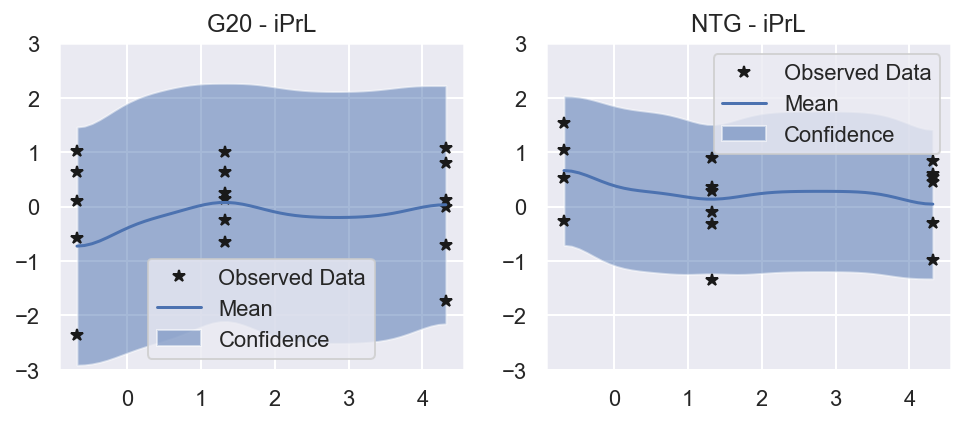

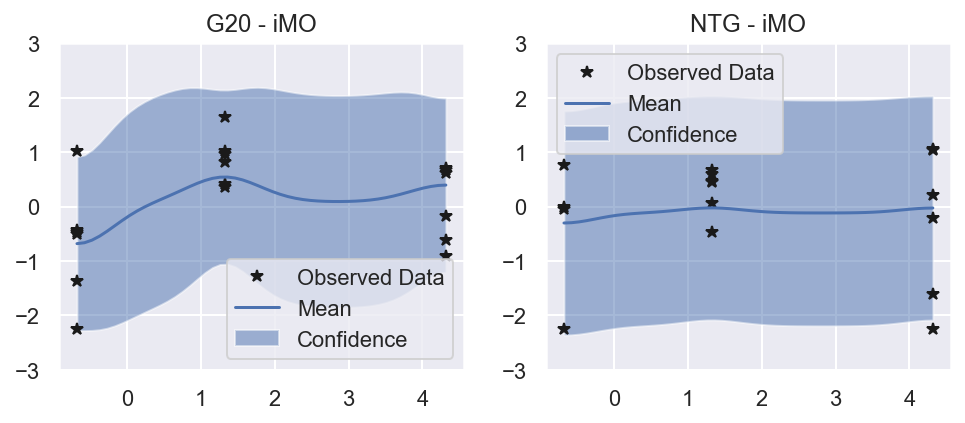

...

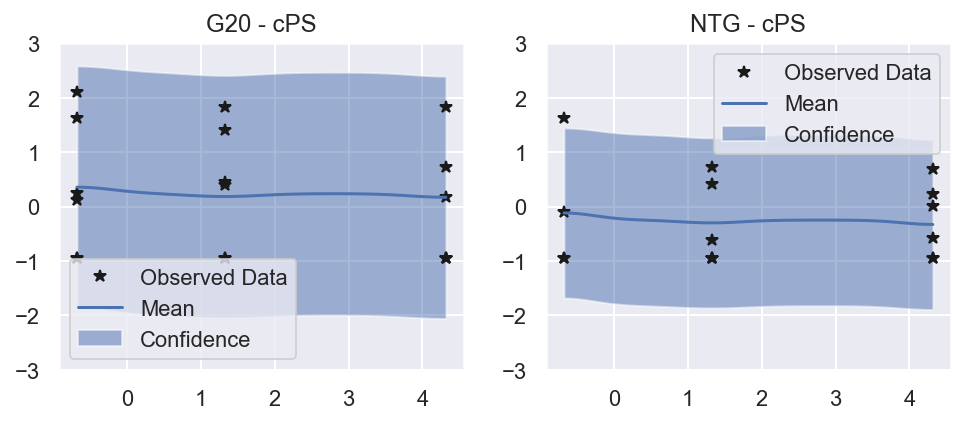

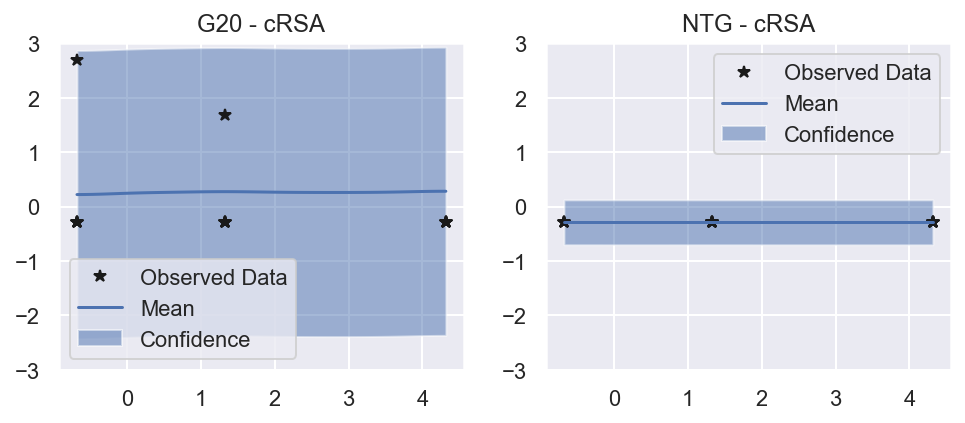

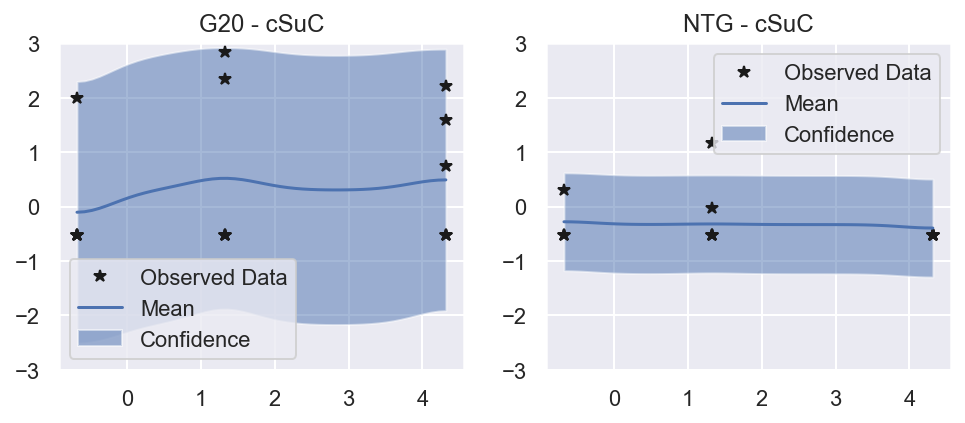

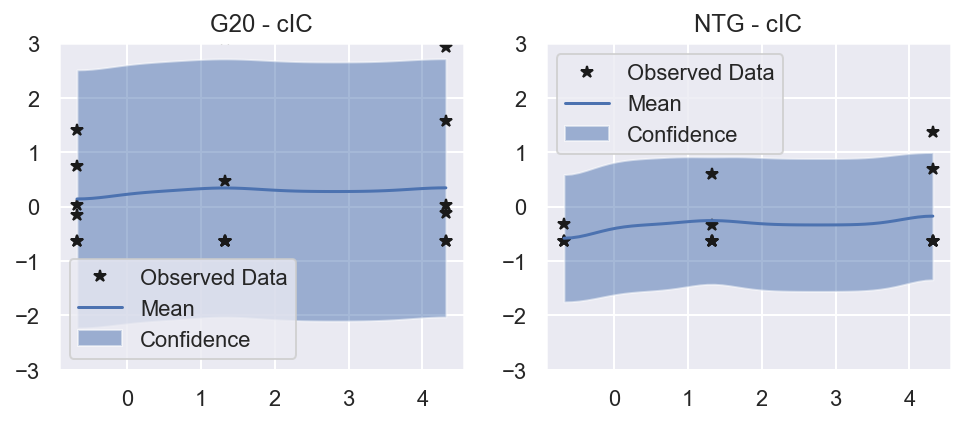

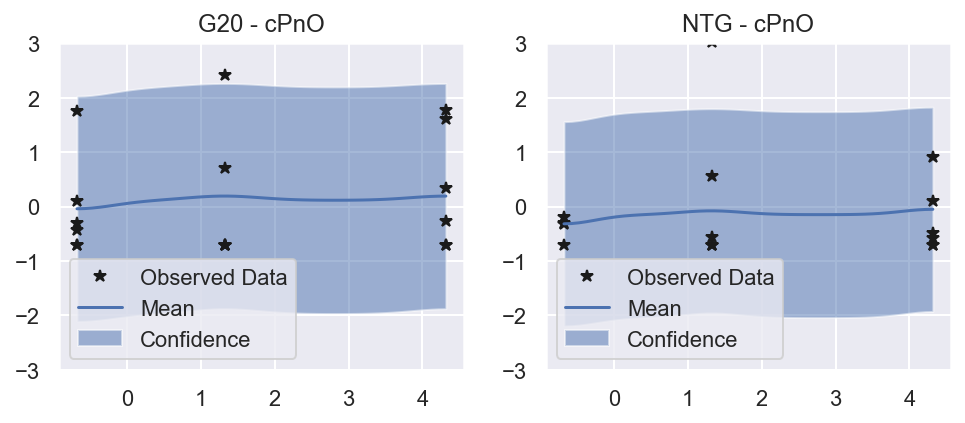

In [81]:
for c in column:
    want_to_see = column.index(c)
    
    # This contains predictions for both tasks, flattened out
    # The first half of the predictions is for the first task
    # The second half is for the second task

    # Initialize plots
    f, axes = plt.subplots(figsize=(8, 3), ncols=2)
    
    for i, cond in enumerate(('G20', 'NTG')):
        
        # Select ax
        ax = axes[i]
        
        mean, lower, upper = predict(test_x=test_x, **results[cond])
        train_y = y_data[cond]
        train_x = x_data[cond]

        # Plot training data as black stars
        ax.plot(train_x.detach().numpy(), train_y[:, want_to_see].detach().numpy(), 'k*')
        # Predictive mean as blue line
        ax.plot(test_x.numpy(), mean[:, want_to_see].numpy(), 'b')
        # Shade in confidence
        ax.fill_between(test_x.numpy(), lower[:, want_to_see].numpy(), upper[:, want_to_see].numpy(), alpha=0.5)
        ax.set_ylim([-3, 3])
        ax.legend(['Observed Data', 'Mean', 'Confidence'])
        ax.set_title(f'{cond} - {c}')
    
    plt.show()

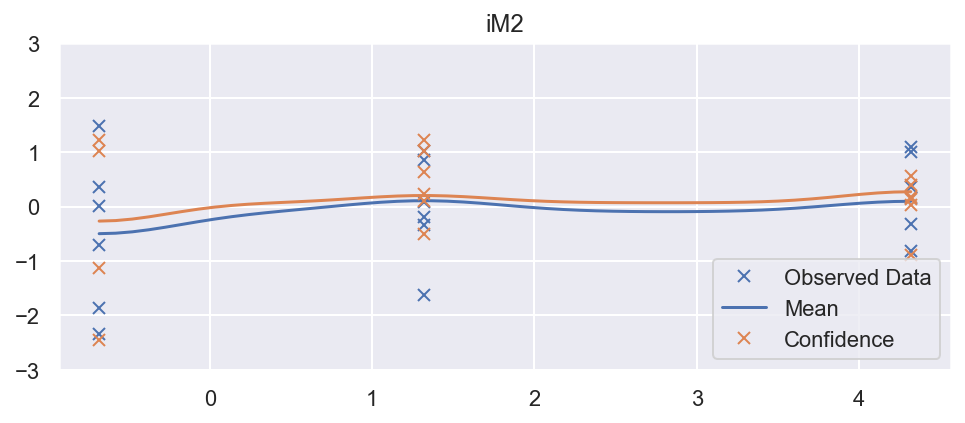

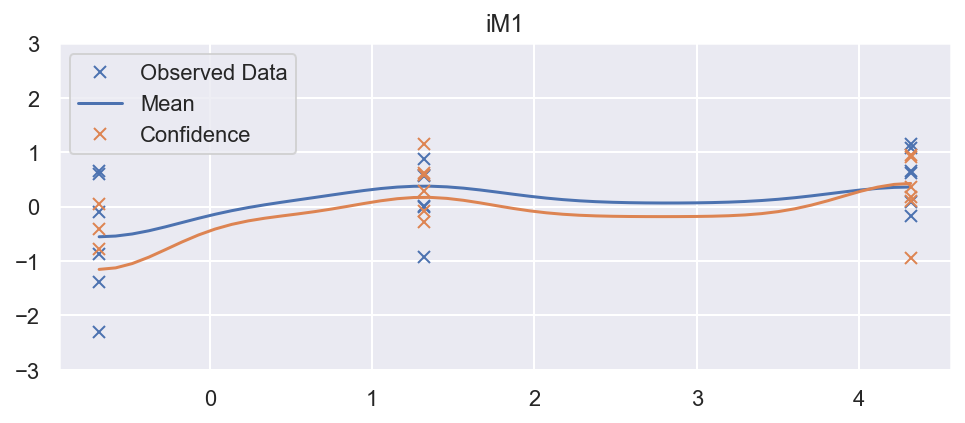

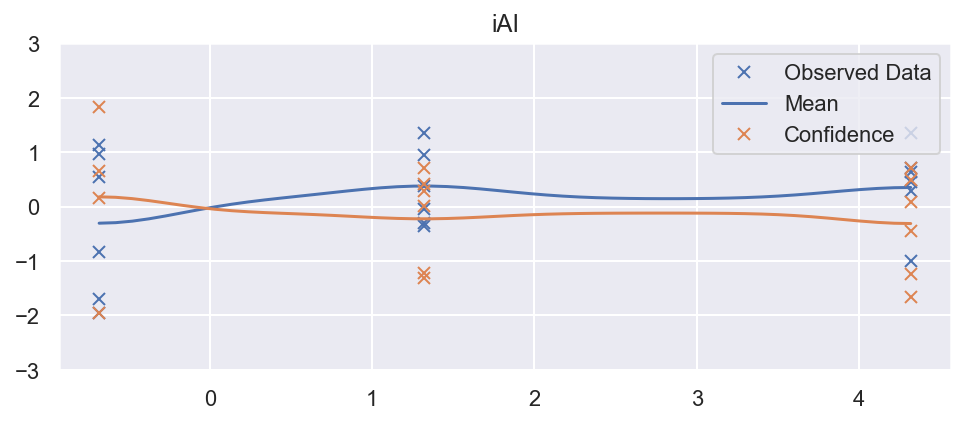

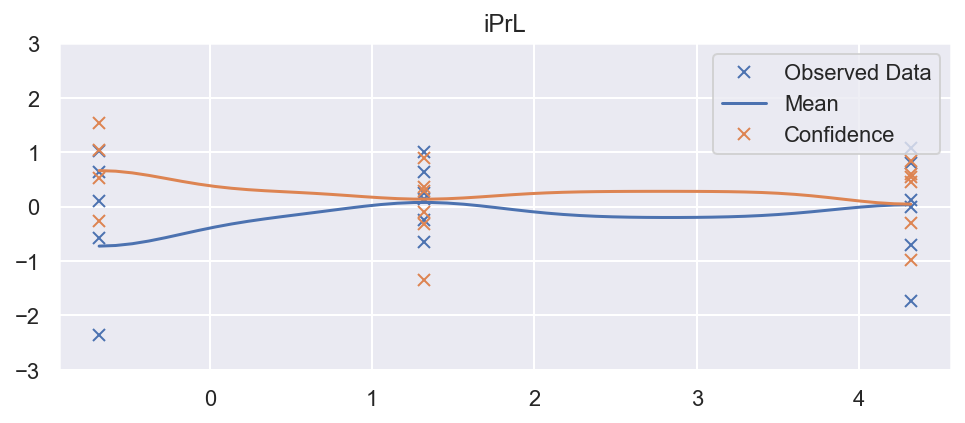

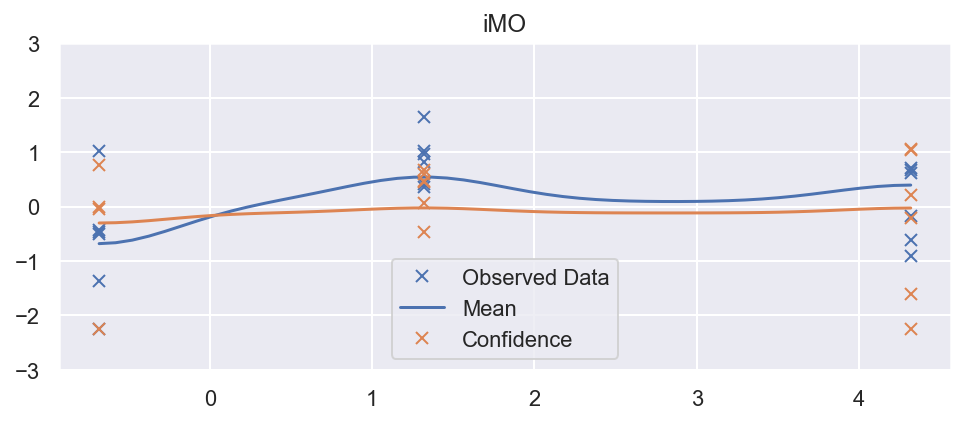

...

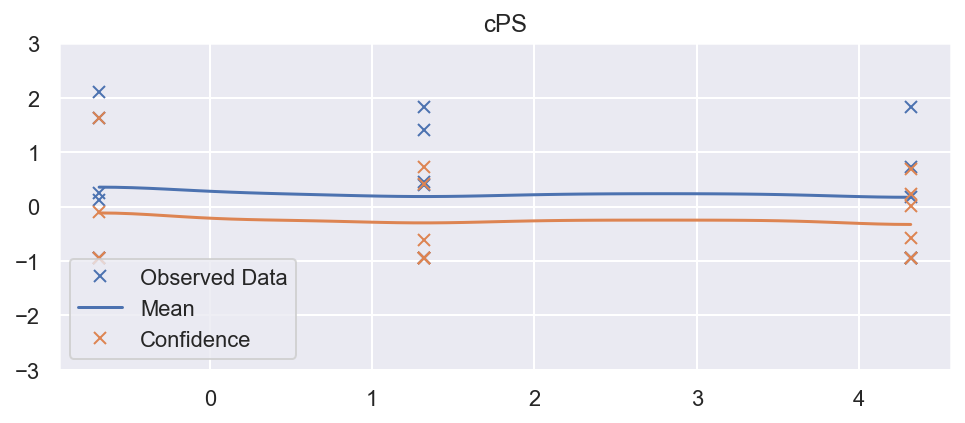

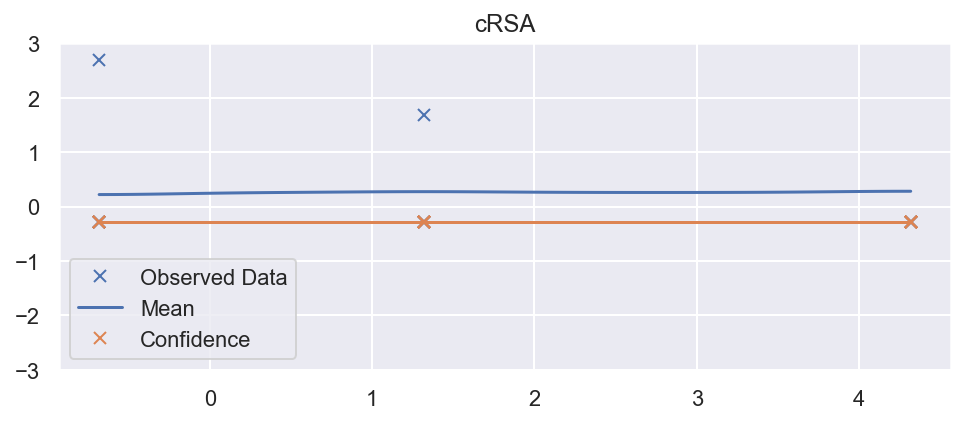

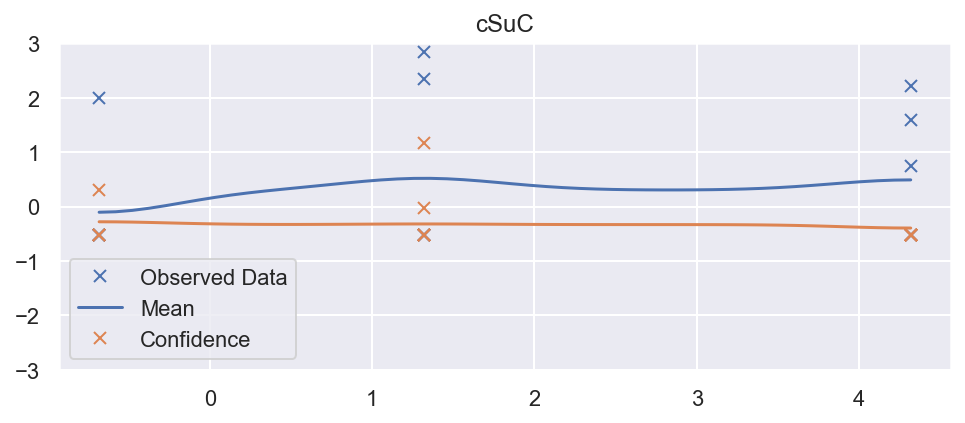

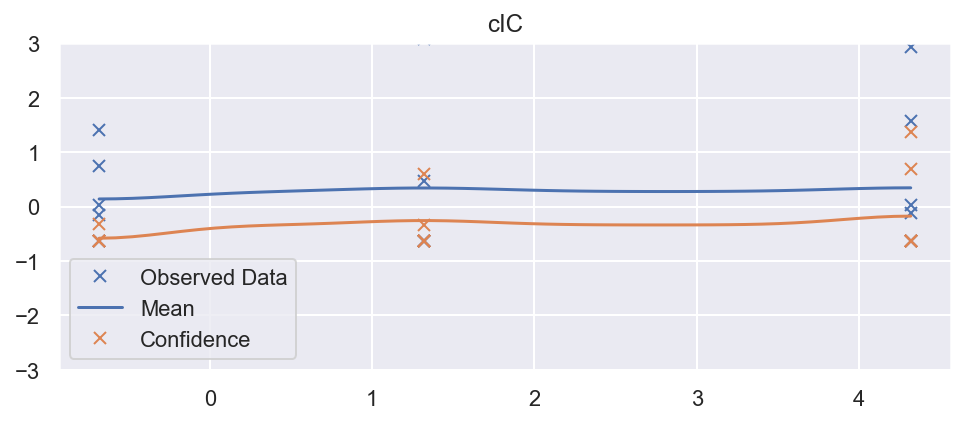

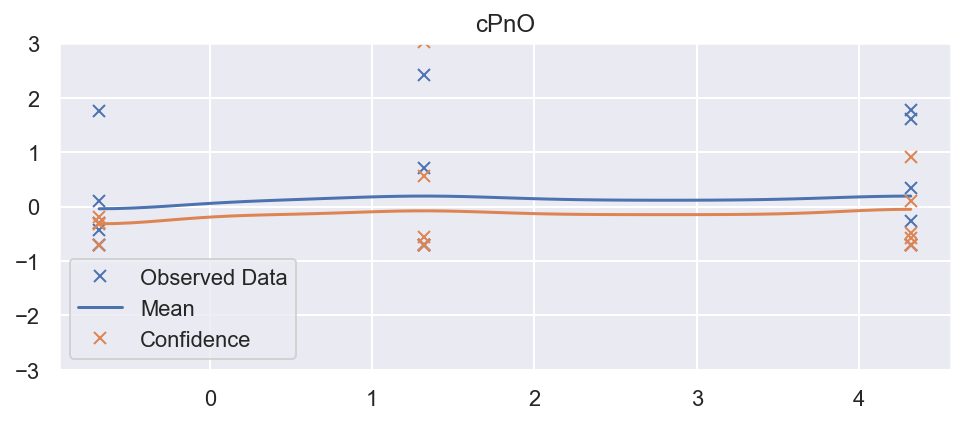

In [82]:
for c in column:
    
    want_to_see = column.index(c)
    
    # This contains predictions for both tasks, flattened out
    # The first half of the predictions is for the first task
    # The second half is for the second task

    # Initialize plots
    f, ax = plt.subplots(figsize=(8, 3))
    
    for i, cond in enumerate(('G20', 'NTG')):
        
        color = f'C{i}'

        mean, lower, upper = predict(test_x=test_x, **results[cond])
        train_y = y_data[cond]
        train_x = x_data[cond]

        # Plot training data
        ax.plot(train_x.detach().numpy(), train_y[:, want_to_see].detach().numpy(), 'x', color=color)
        
        # Predictive mean
        ax.plot(test_x.numpy(), mean[:, want_to_see].numpy(), color=color)
    
#         # Shade in confidence
#         ax.fill_between(test_x.numpy(), lower[:, want_to_see].numpy(), upper[:, want_to_see].numpy(), alpha=0.5)
    ax.set_ylim([-3, 3])
    ax.legend(['Observed Data', 'Mean', 'Confidence'])
    ax.set_title(f'{c}')
    
    plt.show()